## **Testing LightNet using Coffee roasting dataset**

#### We'll be testing LightNet using the coffee roasting example.

#### "The results show that **LightNet** is able to reproduce results expected of a neural network quite well with a score of .965 on the testing set."

In [18]:
import sys
sys.path.append("D:\Development\Machine_Learning\ML_Algorithms\coursera-2\Week-2\Computational_graphs")

In [19]:
import LightNet as ln
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Normalization
import lab_coffee_utils as lcu

#### Loading the coffee roating dataset and visualising it

In [20]:
X,Y=lcu.load_coffee_data()
print(X.shape, Y.shape)

# X is the input array, while Y is the output array 
# X[0] is the temprature, X[1] is the duration

(200, 2) (200, 1)


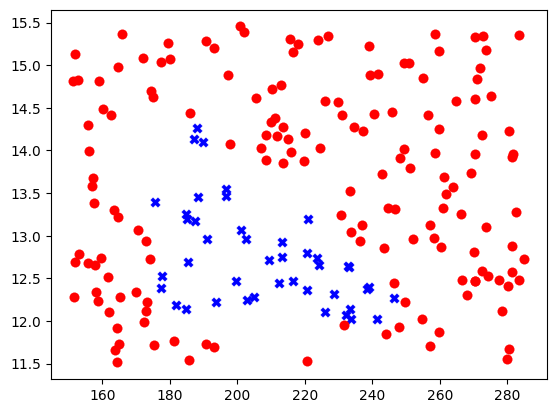

In [21]:
plt.scatter(X[Y[:,0]==1,0], X[Y[:,0]==1,1], marker='X', color='b', linewidths=.1, s=50)
plt.scatter(X[Y[:,0]==0,0], X[Y[:,0]==0,1], marker='o', color='r', linewidths=.1, s=50)
plt.show()

#### Normalising and tiling the dataset

In [22]:
norm=Normalization(axis=1) # norm is the normalisation layer object
norm.adapt(X) # adapt function calculates the value of mean and variance of each column(axis is set to be 0)
Xn=norm(X)

In [23]:
Xt=np.tile(Xn,(100,1))
Yt=np.tile(Y, (100,1))

#### Building the model

In [24]:
model=ln.Network([(2,),
                  ln.Layer(units=3, activation='sigmoid', label='L1'),
                  ln.Layer(units=1, activation='sigmoid', label='L2')])

In [25]:
model.get_weights()     #weights before training(initialised wieghts)

L1
Weights: 
[[ 0.05551679  1.89979817  0.22001064]
 [ 0.97099313 -0.54137064 -2.066166  ]
 [-0.42638868 -0.08540592 -0.10860438]]
L2
Weights: 
[[-1.59200899 -0.93186169  0.95586026 -0.29396652]]


In [26]:
model.train(Xt, Yt, 10, .01)

Node: data=[0.8097], label='Loss', op='['BCE']'
Node: data=[0.4967], label='Loss', op='['BCE']'
Node: data=[0.2283], label='Loss', op='['BCE']'
Node: data=[0.7520], label='Loss', op='['BCE']'
Node: data=[1.3757], label='Loss', op='['BCE']'
Node: data=[0.8148], label='Loss', op='['BCE']'
Node: data=[0.2712], label='Loss', op='['BCE']'
Node: data=[0.2865], label='Loss', op='['BCE']'
Node: data=[0.1843], label='Loss', op='['BCE']'
Node: data=[0.7595], label='Loss', op='['BCE']'
Node: data=[1.1599], label='Loss', op='['BCE']'
Node: data=[0.1842], label='Loss', op='['BCE']'
Node: data=[0.2322], label='Loss', op='['BCE']'
Node: data=[0.2572], label='Loss', op='['BCE']'
Node: data=[0.7661], label='Loss', op='['BCE']'
Node: data=[0.2434], label='Loss', op='['BCE']'
Node: data=[0.1986], label='Loss', op='['BCE']'
Node: data=[0.3867], label='Loss', op='['BCE']'
Node: data=[0.2859], label='Loss', op='['BCE']'
Node: data=[0.3006], label='Loss', op='['BCE']'
Node: data=[0.2094], label='Loss', op='[

In [27]:
X_test = np.array([[200,13.9],[200,17]])
X_testn=norm(X_test) #normalising the test data
a1=model(X_testn[0])
a2=model(X_testn[1])
print(a1)   #expected output 1
print(a2)   #expected output 0

Node: data=[0.7128], label='I: L3', op='['buf']'
Node: data=[0.0027], label='I: L3', op='['buf']'


In [28]:
model.get_weights()     #weights after training

L1
Weights: 
[[ 7.18784112  6.34459953  0.18526033]
 [ 0.70316418 -4.02339274 -5.00007905]
 [ 5.97272823  0.15370554  6.59096794]]
L2
Weights: 
[[-10.95710769  -7.38966378   9.74063657  -4.57468533]]


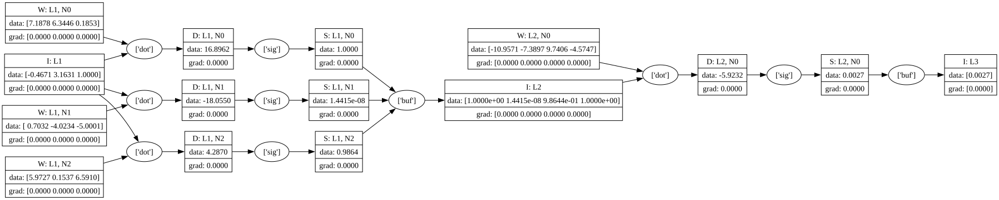

In [29]:
model.draw()

In [30]:
w1=model.layers[1].get_weights()
w1

array([[ 7.18784112,  6.34459953,  0.18526033],
       [ 0.70316418, -4.02339274, -5.00007905],
       [ 5.97272823,  0.15370554,  6.59096794]])

#### Visualising the desicion boundries created by the network

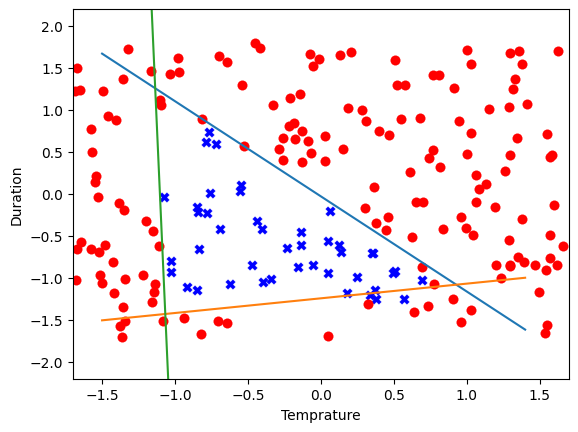

In [31]:
Xp=np.arange(-1.5,1.5,.1, dtype=float)
Xp1=np.arange(-.5,.5,.01, dtype=float)

Y0= -(Xp*w1[0][0])/w1[0][1]-(w1[0][2]/w1[0][1])
Y1= -(Xp*w1[1][0])/w1[1][1]-(w1[1][2]/w1[1][1])
Y2= -(Xp*w1[2][0])/w1[2][1]-(w1[2][2]/w1[2][1])
Xn2=np.array(Xn) # Xn is a tensor while Xn2 is a numpy array, this conversion is important
plt.scatter(Xn2[Y[:,0]==1,0], Xn2[Y[:,0]==1,1], marker='X', color='b', linewidths=.1, s=50)
plt.scatter(Xn2[Y[:,0]==0,0], Xn2[Y[:,0]==0,1], marker='o', color='r', linewidths=.1, s=50)
plt.plot(Xp,Y0)
plt.plot(Xp,Y1)
plt.plot(Xp, Y2)
plt.xlabel('Temprature')
plt.ylabel('Duration')
plt.xlim(-1.7,1.7)
plt.ylim(-2.2,2.2)
plt.show()

In [32]:
model.score(Xt, Yt)

0.99